# DATA PREPROCESSING

## 1. Đọc và hiển thị dữ liệu

### 1.1 Các thư viện cần thiết để xử lí dữ liệu dạng bảng
Pandas là một thư viện phần mềm được viết cho ngôn ngữ lập trình Python để thao tác và phân tích dữ liệu.

In [1]:
!pip install pandas
!pip install numpy

In [2]:
import pandas as pd # Gọi thư viện pandas
# import pandas
# from pandas import *

NumPy là một thư viện dành cho ngôn ngữ lập trình Python, hỗ trợ thêm cho các mảng và ma trận lớn, đa chiều, cùng với một bộ sưu tập lớn các hàm toán học cấp cao để hoạt động trên các mảng này.

In [3]:
import numpy as np # Gọi thư viện numpy

### 1.2 Đọc và hiển thị dữ liệu

### Đọc dữ liệu

In [36]:
data = pd.read_csv('BTH2.csv')

### Hiển thị dữ liệu

In [5]:
data
# display(data)

,Region,Age,Income,Online Shopper
0,India,49.0,86400.0,No
1,Brazil,32.0,57600.0,Yes
2,USA,35.0,64800.0,No
3,Brazil,43.0,73200.0,No
4,USA,45.0,NaN,Yes
5,NaN,40.0,69600.0,Yes
6,Brazil,NaN,62400.0,No
7,India,53.0,94800.0,Yes
8,USA,55.0,99600.0,No
9,India,42.0,80400.0,Yes


### 1.3 Một số thao tác cơ bản với dữ liệu

#### 1.3.1 Xem thông tin về Index, kiểu dữ liệu và dung lượng

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Region          9 non-null      object 
 1   Age             9 non-null      float64
 2   Income          9 non-null      float64
 3   Online Shopper  10 non-null     object 
dtypes: float64(2), object(2)
memory usage: 448.0+ bytes


#### 1.3.2 Thống kê số lượng giá trị

In [7]:
data.value_counts()

Region  Age   Income   Online Shopper
Brazil  32.0  57600.0  Yes               1
        43.0  73200.0  No                1
India   42.0  80400.0  Yes               1
        49.0  86400.0  No                1
        53.0  94800.0  Yes               1
USA     35.0  64800.0  No                1
        55.0  99600.0  No                1
Name: count, dtype: int64

#### 1.3.3 Thống kê số lượng giá trị còn trống

In [8]:
data.isna().sum()

Region            1
Age               1
Income            1
Online Shopper    0
dtype: int64

#### 1.3.4 Lấy mẫu dữ liệu

In [9]:
num_sample = 5
data.sample(num_sample)

,Region,Age,Income,Online Shopper
6,Brazil,NaN,62400.0,No
4,USA,45.0,NaN,Yes
2,USA,35.0,64800.0,No
0,India,49.0,86400.0,No
3,Brazil,43.0,73200.0,No


#### 1.3.5 Một số các thao tác khác

## 2. Tiền xử lí dữ liệu
Trên thực tế, dữ liệu mà chúng ta nhận được thường sẽ bị thô, nói cách khác, bất cứ khi nào dữ liệu được thu thập từ các nguồn khác nhau, nó được thu thập ở định dạng thô không khả thi cho việc phân tích. Để đạt được kết quả tốt hơn từ mô hình được áp dụng trong các dự án ML , định dạng của dữ liệu phải theo cách phù hợp. Một số mô hình ML được chỉ định cần thông tin ở định dạng được chỉ định.

 - Tiền xử lý dữ liệu đề cập đến các phép biến đổi được áp dụng cho dữ liệu của chúng ta trước khi đưa nó vào thuật toán.
 - Tiền xử lý dữ liệu là một kỹ thuật được sử dụng để chuyển đổi dữ liệu thô thành một tập dữ liệu sạch. 

### 2.1 Xử lí dữ liệu bị thiếu
Dữ liệu bị thiếu do trong quá trình thu thập không đầy đủ hoặc không có các số liệu cần thiết.
Các phương pháp xử lí dữ liệu còn thiếu:
- Điền các giá trị NaN bằng phương pháp giá trị trung bình
- Điền các giá trị NaN bằng phương pháp tần số cao nhất
- ...

#### 2.1.1 Phương pháp giá trị trung bình
    Áp dụng cho các trường dữ liệu số.

In [10]:
df1 = data.copy() # sao chép dữ liệu giúp thuận tiện cho việc sửa lỗi

In [11]:
display(df1.isna().sum())
display(df1)

Region            1
Age               1
Income            1
Online Shopper    0
dtype: int64

,Region,Age,Income,Online Shopper
0,India,49.0,86400.0,No
1,Brazil,32.0,57600.0,Yes
2,USA,35.0,64800.0,No
3,Brazil,43.0,73200.0,No
4,USA,45.0,NaN,Yes
5,NaN,40.0,69600.0,Yes
6,Brazil,NaN,62400.0,No
7,India,53.0,94800.0,Yes
8,USA,55.0,99600.0,No
9,India,42.0,80400.0,Yes


In [37]:
# Tiến hành thay giá trị 'NaN' bằng giá trị trung bình
df1['Age'].fillna(round(data['Age'].mean()),inplace=True)
df1['Income'].fillna(round(data['Income'].mean()),inplace=True)

C:\Users\pc\AppData\Local\Temp\ipykernel_17812\2025838969.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df1['Age'].fillna(round(data['Age'].mean()),inplace=True)
C:\Users\pc\AppData\Local\Temp\ipykernel_17812\2025838969.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For 

    *Note:
        - fillna() : hàm điền giá trị NaN
        - round() : hàm tròn giá trị cho trước
        - mean() : hàm lấy giá trị trung bình

In [13]:
df1
# df1.isna().sum()

,Region,Age,Income,Online Shopper
0,India,49.0,86400.0,No
1,Brazil,32.0,57600.0,Yes
2,USA,35.0,64800.0,No
3,Brazil,43.0,73200.0,No
4,USA,45.0,76533.0,Yes
5,NaN,40.0,69600.0,Yes
6,Brazil,44.0,62400.0,No
7,India,53.0,94800.0,Yes
8,USA,55.0,99600.0,No
9,India,42.0,80400.0,Yes


#### 2.2.2 Phương pháp tần số cao nhất
    Áp dụng cho các trường giá trị rời rạc

In [14]:
# Tiến hành thay giá trị 'NaN' bằng giá trị xuất hiện với tần số lớn nhất
df1['Region'].fillna(df1['Region'].mode()[0], inplace = True)

C:\Users\pc\AppData\Local\Temp\ipykernel_17812\3666894540.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df1['Region'].fillna(df1['Region'].mode()[0], inplace = True)


    *Note: 
        - mode() : hàm lấy giá trị có tần số xuất hiện lớn nhất

In [15]:
df1

,Region,Age,Income,Online Shopper
0,India,49.0,86400.0,No
1,Brazil,32.0,57600.0,Yes
2,USA,35.0,64800.0,No
3,Brazil,43.0,73200.0,No
4,USA,45.0,76533.0,Yes
5,Brazil,40.0,69600.0,Yes
6,Brazil,44.0,62400.0,No
7,India,53.0,94800.0,Yes
8,USA,55.0,99600.0,No
9,India,42.0,80400.0,Yes


#### Kiểm tra lại dữ liệu sau khi xử lí

In [16]:
df1.isna().sum()

Region            0
Age               0
Income            0
Online Shopper    0
dtype: int64

Ngoài ra còn có rất nhiều các phương pháp xử lí dữ liệu bị thiếu khác.

### 2.2 Chuẩn hóa dữ liệu theo MinMax
- Xnew : Giá trị sau khi chuẩn hóa
- Xi : Giá trị trước khi chuẩn hóa
- min(X) : Giá trị nhỏ nhất của trường dữ liệu
- max(X) : Giá trị lớn nhất của trường dữ liệu

<img src = "min_max_normalisation.jpg" width='400'>
     

#### Chuẩn hóa 2 thuộc tính "Age" và "Income"

In [17]:
df2 = df1.copy()

In [18]:
age_min = df2['Age'].min()
age_max = df2['Age'].max()

income_min = df2['Income'].min()
income_max = df2['Income'].max()

    *Note: - min(): Hàm lấy GTNN
           - max(): Hàm lấy GTLN

In [19]:
# Thực hiện chuẩn hóa theo minmax với 2 trường dữ liệu đã có
df2['Age'] = (df2['Age'] - age_min)/(age_max - age_min)
df2['Income'] = (df2['Income'] - income_min)/(income_max - income_min)

#### Kiểm tra lại dữ liệu sau khi chuẩn hóa

In [20]:
df2

,Region,Age,Income,Online Shopper
0,India,0.739130,0.685714,No
1,Brazil,0.000000,0.000000,Yes
2,USA,0.130435,0.171429,No
3,Brazil,0.478261,0.371429,No
4,USA,0.565217,0.450786,Yes
5,Brazil,0.347826,0.285714,Yes
6,Brazil,0.521739,0.114286,No
7,India,0.913043,0.885714,Yes
8,USA,1.000000,1.000000,No
9,India,0.434783,0.542857,Yes


### 2.3 Liên tục hóa dữ liệu

In [21]:
df3 = df2.copy()

Kiểm tra các thông tin có trong trường "Region"

In [22]:
df3['Region'].unique()

array(['India', 'Brazil', 'USA'], dtype=object)

Note: unique() là hàm liệt kê các giá trị trong 1 trường dữ liệu mà không bao gồm các dữ liệu bị trùng lặp  

Sau khi kiểm tra các dữ liệu, đưa trường "Region" về dạng One-Hot Encoder

In [23]:
dummies = pd.get_dummies(df3['Region'])
display(dummies)

,Brazil,India,USA
0,False,True,False
1,True,False,False
2,False,False,True
3,True,False,False
4,False,False,True
5,True,False,False
6,True,False,False
7,False,True,False
8,False,False,True
9,False,True,False


Thực hiện nối các trường dữ liệu ở dạng One-Hot với dữ liệu ban đầu

In [24]:
df3 = pd.concat([df3,dummies], axis=1)
df3.drop('Region', axis=1, inplace=True)
df3

,Age,Income,Online Shopper,Brazil,India,USA
0,0.739130,0.685714,No,False,True,False
1,0.000000,0.000000,Yes,True,False,False
2,0.130435,0.171429,No,False,False,True
3,0.478261,0.371429,No,True,False,False
4,0.565217,0.450786,Yes,False,False,True
5,0.347826,0.285714,Yes,True,False,False
6,0.521739,0.114286,No,True,False,False
7,0.913043,0.885714,Yes,False,True,False
8,1.000000,1.000000,No,False,False,True
9,0.434783,0.542857,Yes,False,True,False


### 2.4 Rời rạc hóa dữ liệu
- Một số thuật toán phân loại chỉ chấp nhận các thuộc tính phân loại.
- Giúp giảm kích thước dữ liệu
- ...

In [25]:
df4 = df3.copy()

In [26]:
df4.Income = pd.cut(df4["Income"],
       bins=[-0.1, 0.2, 0.4, 0.6, 0.8, 1],
       labels=["Very Low", "Low", "Medium", "High", "Very High"])
df4

,Age,Income,Online Shopper,Brazil,India,USA
0,0.739130,High,No,False,True,False
1,0.000000,Very Low,Yes,True,False,False
2,0.130435,Very Low,No,False,False,True
3,0.478261,Low,No,True,False,False
4,0.565217,Medium,Yes,False,False,True
5,0.347826,Low,Yes,True,False,False
6,0.521739,Very Low,No,True,False,False
7,0.913043,Very High,Yes,False,True,False
8,1.000000,Very High,No,False,False,True
9,0.434783,Medium,Yes,False,True,False


- bins: là các khoảng cần rời rạc hóa
- labels: là các nhãn gắn vào các khoảng tương ứng

In [27]:
!pip install pillow 
!pip install image 

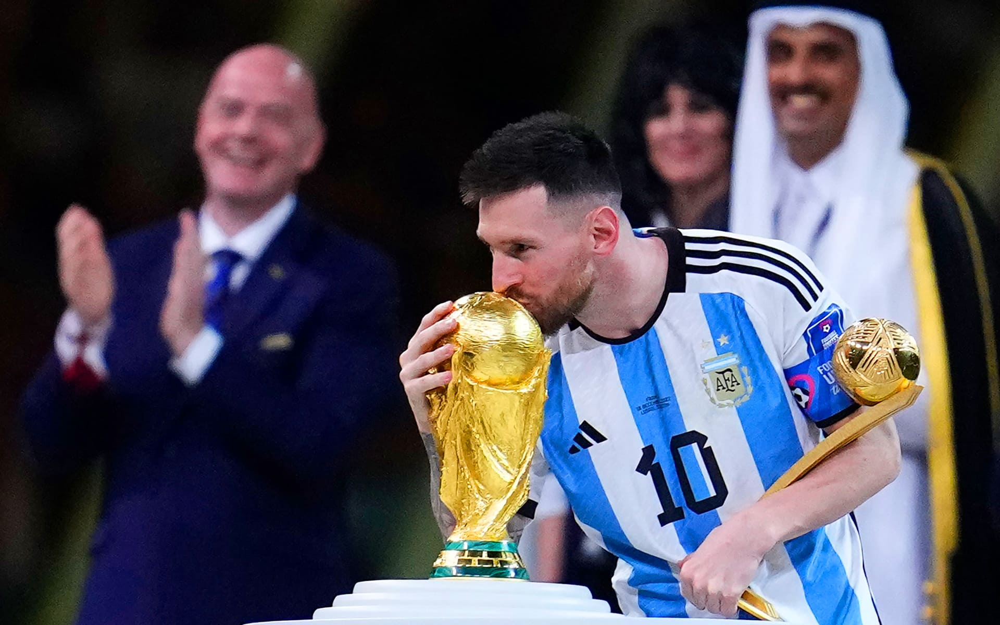

In [28]:
from PIL import Image

img = Image.open("Messi WC2022.jpg")
img

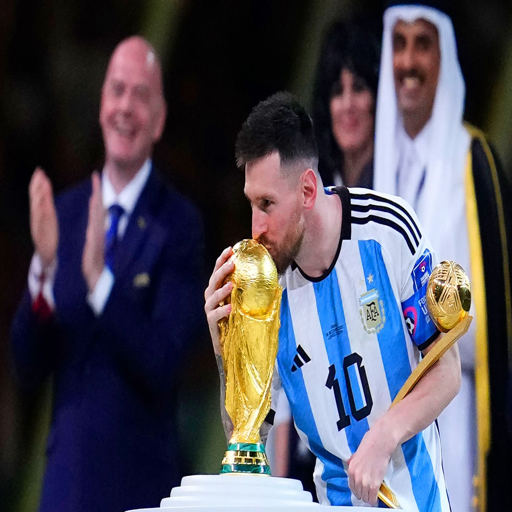

In [29]:
img_resized = img.resize((512, 512))
img_resized

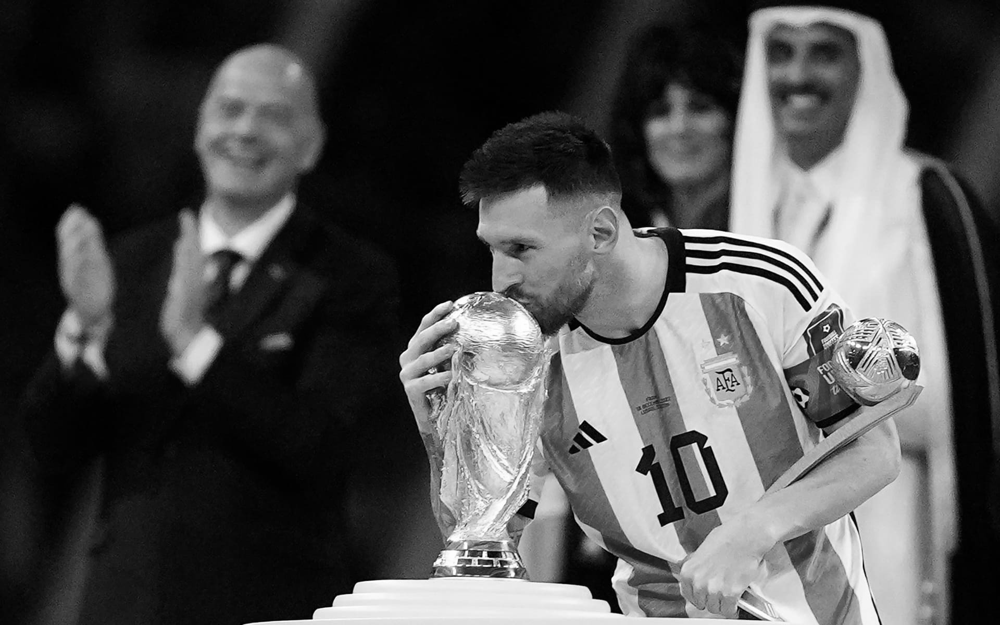

In [30]:
img_gray = img.convert("L")
img_gray

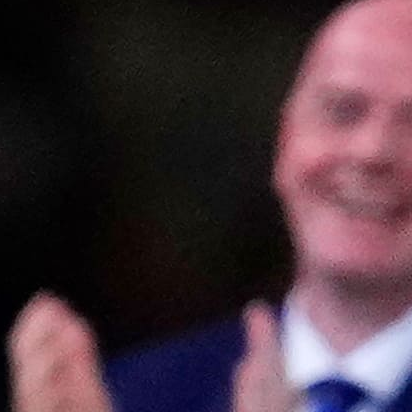

In [31]:
img_cropped = img.crop((100, 100, 512, 512))
img_cropped

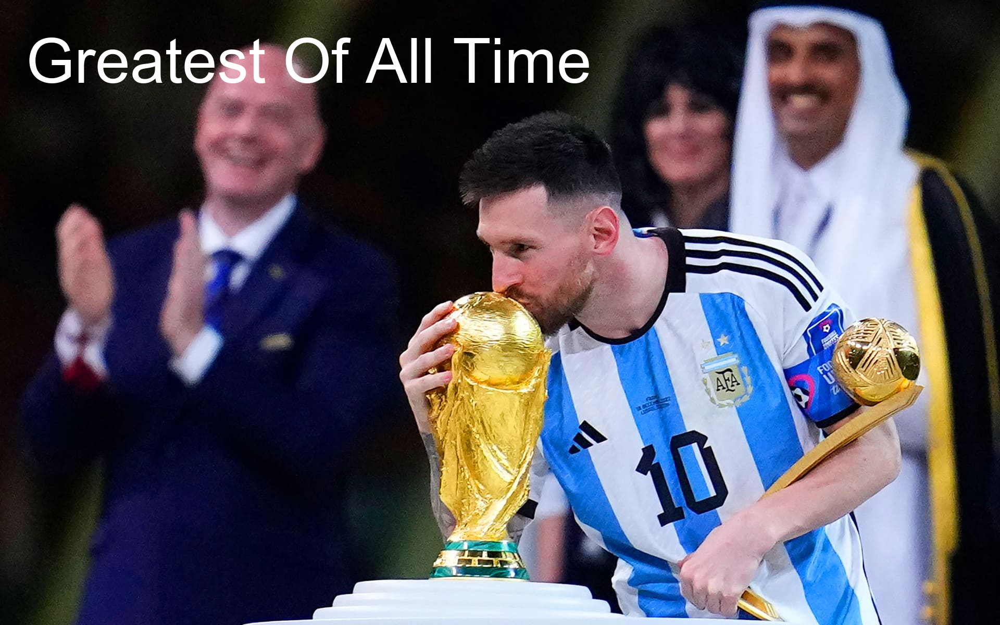

In [32]:
from PIL import ImageDraw, ImageFont

img_draw = img.copy()

# Tạo một đối tượng Draw
draw = ImageDraw.Draw(img_draw)
# Đặt font và kích thước chữ
font = ImageFont.truetype("arial.ttf", 120)
# Thêm text vào hình ảnh
draw.text((50, 50), "Greatest Of All Time", font=font, fill=(512, 512, 512))

img_draw

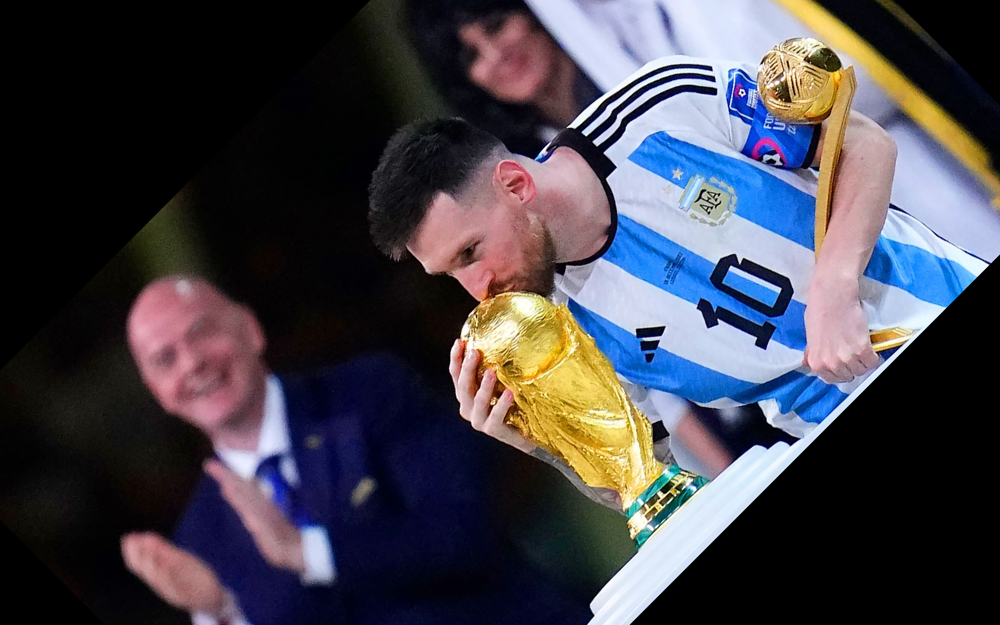

In [33]:
# Xoay hình ảnh 45 độ
img_rotated = img.rotate(45)
# Lưu lại hình ảnh đã xoay
img_rotated

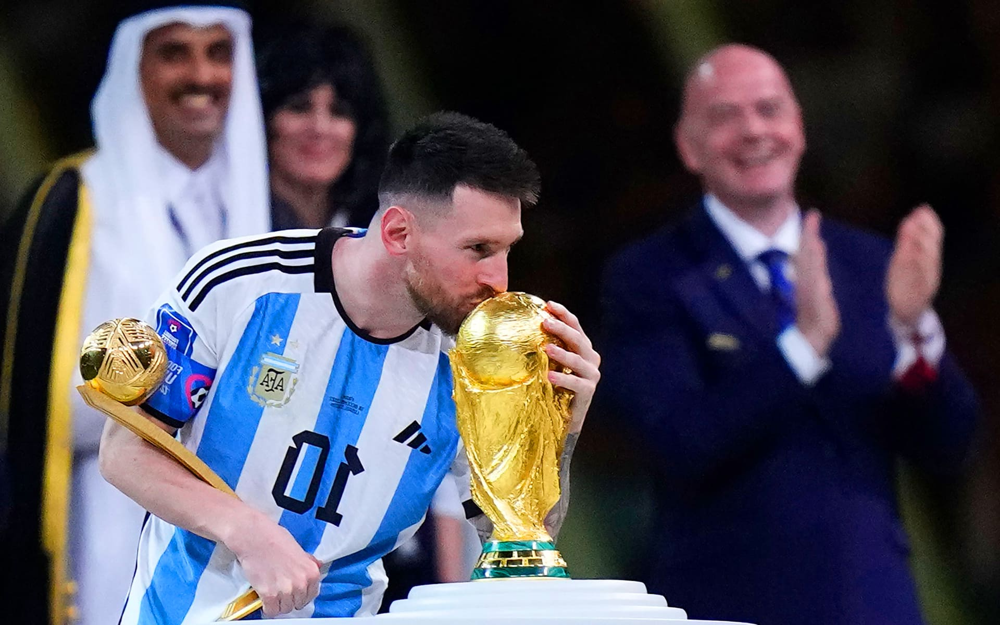

In [34]:
img_flipped = img.transpose(Image.FLIP_LEFT_RIGHT)

img_flipped

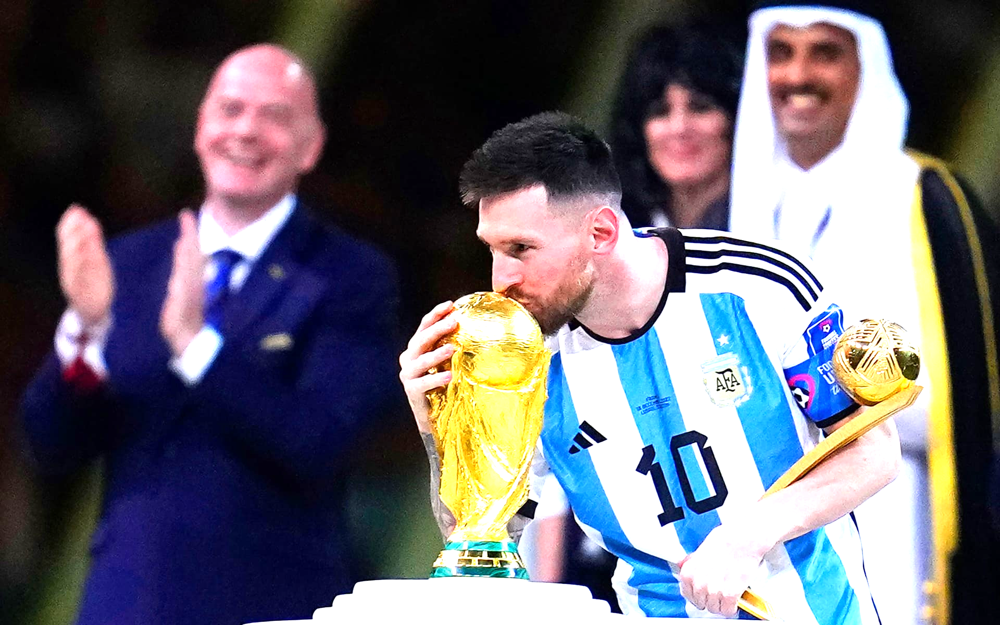

In [35]:
from PIL import ImageEnhance

# Chỉnh sửa độ sáng
enhancer = ImageEnhance.Brightness(img)
img_brightened = enhancer.enhance(1.5)
# Lưu lại hình ảnh đã chỉnh sửa độ sáng
img_brightened